# Business Case

---

### **Problem Statement:**

1. Despite substantial efforts by banks to attract and retain customers, customer churn remains a persistent challenge in the banking industry. This issue leads to significant financial losses and adversely impacts customer satisfaction.
2. Identifying and understanding the factors that influence a customer’s decision to leave is essential for effectively addressing churn and improving retention strategies.

### **Proposed Approach:**

1. The primary objective of this project is to analyze customer churn rates to uncover the reasons behind customers’ decisions to leave.
2. Leveraging these insights, the project will focus on developing and training a Machine Learning model capable of identifying the key factors contributing to customer churn.
3. Finally, the project will identify and implement the most reliable predictive model, enabling the assignment of churn probabilities. This will empower customer service teams to proactively target at-risk customers, minimize churn, and optimize retention efforts.
4. You could also explore the following:
    1. How can the insights from churn analysis be translated into actionable strategies for different teams (e.g., marketing, customer service, and product development)?
    2. What proactive measures can be implemented to reduce churn rates before customers consider leaving?
    3. How should the company prioritize its resources to target high-risk customers effectively?
    4. What role does personalization play in customer retention, and how can it be incorporated into product or service offerings?

---

### About the data:

1. **CustomerId:** It is used to track and differentiate individual customers.
2. **Surname:** It provides information about the family name of each customer.
3. **CreditScore:** It is a numerical value that assesses the creditworthiness of an individual based on their credit history and financial behavior.
4. **Geography:** It provides information about the customers' geographic distribution, allowing for analysis based on regional or national factors.
5. **Gender:** It categorizes customers as either male or female, enabling gender-based analysis if relevant to the churn prediction.
6. **Age:** It represents the customer's age in years and can be used to analyze age-related patterns and behaviors.
7. **Tenure:** It typically represents the number of years or months the customer has been associated with the bank.
8. **Balance:** It reflects the amount of money in the customer's bank account at a specific point in time.
9. **NumOfProducts:** It can include various offerings such as savings accounts, loans, credit cards, etc.
10. **HasCrCard:** It is a binary variable with a value of 1 if the customer possesses a credit card and 0 otherwise.
11. **IsActiveMember:** It is a binary variable indicating whether the customer is an active member (1) or not (0) within the bank.
12. **EstimatedSalary:** It provides an approximation of the customer's income level, which can be relevant for analyzing churn behavior.
13. **Exited:** It indicates whether a customer has churned (1) or not (0) from the bank. It is the variable we aim to predict using the other features.


In [2]:
!pip install pycaret

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 169.6/169.6 kB 7.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
INFO: pip is looking at multiple versions of category-encoders to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 486.1/486.1 kB 19.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.8/106.8 kB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.8/21.8 MB 17.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.4/85.4 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.2/302.2 kB 16.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 10.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 62.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.2/12.2 MB 65.0 MB/s eta 0:00:00
   ━━━━

In [2]:
!pip install scikit-optimize


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.8/107.8 kB 3.2 MB/s eta 0:00:00


In [3]:
# Importing libraries
import pandas as pd
import numpy as np
import plotly.express as px
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
import seaborn as sns
from pycaret.classification import *
from pycaret.classification import predict_model
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from imblearn.over_sampling import SMOTE
from skopt import BayesSearchCV
import xgboost as xgb
import joblib
from pycaret.classification import load_model, predict_model

In [5]:
# Reading information
df_train = pd.read_csv('train.csv')
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 165034 entries, 0 to 165033
Data columns (total 14 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   id               165034 non-null  int64  
 1   CustomerId       165034 non-null  int64  
 2   Surname          165034 non-null  object 
 3   CreditScore      165034 non-null  int64  
 4   Geography        165034 non-null  object 
 5   Gender           165034 non-null  object 
 6   Age              165034 non-null  float64
 7   Tenure           165034 non-null  int64  
 8   Balance          165034 non-null  float64
 9   NumOfProducts    165034 non-null  int64  
 10  HasCrCard        165034 non-null  float64
 11  IsActiveMember   165034 non-null  float64
 12  EstimatedSalary  165034 non-null  float64
 13  Exited           165034 non-null  int64  
dtypes: float64(5), int64(6), object(3)
memory usage: 17.6+ MB


In [6]:
df_test = pd.read_csv('test.csv')
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110023 entries, 0 to 110022
Data columns (total 13 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   id               110023 non-null  int64  
 1   CustomerId       110023 non-null  int64  
 2   Surname          110023 non-null  object 
 3   CreditScore      110023 non-null  int64  
 4   Geography        110023 non-null  object 
 5   Gender           110023 non-null  object 
 6   Age              110023 non-null  float64
 7   Tenure           110023 non-null  int64  
 8   Balance          110023 non-null  float64
 9   NumOfProducts    110023 non-null  int64  
 10  HasCrCard        110023 non-null  float64
 11  IsActiveMember   110023 non-null  float64
 12  EstimatedSalary  110023 non-null  float64
dtypes: float64(5), int64(5), object(3)
memory usage: 10.9+ MB


# Exploratory Data Analysis (EDA)

In [ ]:
df_train.describe()

,id,CustomerId,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
count,165034.0000,1.650340e+05,165034.000000,165034.000000,165034.000000,165034.000000,165034.000000,165034.000000,165034.000000,165034.000000,165034.000000
mean,82516.5000,1.569201e+07,656.454373,38.125888,5.020353,55478.086689,1.554455,0.753954,0.497770,112574.822734,0.211599
std,47641.3565,7.139782e+04,80.103340,8.867205,2.806159,62817.663278,0.547154,0.430707,0.499997,50292.865585,0.408443
min,0.0000,1.556570e+07,350.000000,18.000000,0.000000,0.000000,1.000000,0.000000,0.000000,11.580000,0.000000
25%,41258.2500,1.563314e+07,597.000000,32.000000,3.000000,0.000000,1.000000,1.000000,0.000000,74637.570000,0.000000
50%,82516.5000,1.569017e+07,659.000000,37.000000,5.000000,0.000000,2.000000,1.000000,0.000000,117948.000000,0.000000
75%,123774.7500,1.575682e+07,710.000000,42.000000,7.000000,119939.517500,2.000000,1.000000,1.000000,155152.467500,0.000000
max,165033.0000,1.581569e+07,850.000000,92.000000,10.000000,250898.090000,4.000000,1.000000,1.000000,199992.480000,1.000000


**Some initial insights:**
* The average age is 38 years, with a minimum of 18 and a maximum of 92.
* The balance has a median of 0, suggesting that many customers have no funds in their account.
* NumOfProducts ranges from 1 to 4, with most customers having 1 or 2 products.
* Exited has an average of 0.21, indicating that 21% of customers have left the bank.

In [ ]:
df_train.head()

,id,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,0,15674932,Okwudilichukwu,668,France,Male,33.0,3,0.00,2,1.0,0.0,181449.97,0
1,1,15749177,Okwudiliolisa,627,France,Male,33.0,1,0.00,2,1.0,1.0,49503.50,0
2,2,15694510,Hsueh,678,France,Male,40.0,10,0.00,2,1.0,0.0,184866.69,0
3,3,15741417,Kao,581,France,Male,34.0,2,148882.54,1,1.0,1.0,84560.88,0
4,4,15766172,Chiemenam,716,Spain,Male,33.0,5,0.00,2,1.0,1.0,15068.83,0


In [ ]:
# id, customer id and surname columns
df_train['id'].nunique()

165034

In [ ]:
df_train['CustomerId'].nunique()

23221

Customer id must be a unique value for each cient. In this case, I will assume each one of the registers is a different client and this column may be corrupt.

In [ ]:
df_train['Surname'].nunique()

2797

Columns as 'id', 'CustomerId' and 'Surname', are not relevant into this classification problem, so I will filter a new df without them.

In [3]:
# Filtering df
df = df_train.drop(columns=['id', 'CustomerId', 'Surname'])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 165034 entries, 0 to 165033
Data columns (total 11 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   CreditScore      165034 non-null  int64  
 1   Geography        165034 non-null  object 
 2   Gender           165034 non-null  object 
 3   Age              165034 non-null  float64
 4   Tenure           165034 non-null  int64  
 5   Balance          165034 non-null  float64
 6   NumOfProducts    165034 non-null  int64  
 7   HasCrCard        165034 non-null  float64
 8   IsActiveMember   165034 non-null  float64
 9   EstimatedSalary  165034 non-null  float64
 10  Exited           165034 non-null  int64  
dtypes: float64(5), int64(4), object(2)
memory usage: 13.9+ MB


In [ ]:
# Duplicates checking
df_train.duplicated().sum()

np.int64(0)

There are not duplicated registers  in this dataset.

In [4]:
# Changing data types
df['Age'] = df['Age'].astype(int)
df['HasCrCard'] = df['HasCrCard'].astype(int)
df['IsActiveMember'] = df['IsActiveMember'].astype(int)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 165034 entries, 0 to 165033
Data columns (total 11 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   CreditScore      165034 non-null  int64  
 1   Geography        165034 non-null  object 
 2   Gender           165034 non-null  object 
 3   Age              165034 non-null  int64  
 4   Tenure           165034 non-null  int64  
 5   Balance          165034 non-null  float64
 6   NumOfProducts    165034 non-null  int64  
 7   HasCrCard        165034 non-null  int64  
 8   IsActiveMember   165034 non-null  int64  
 9   EstimatedSalary  165034 non-null  float64
 10  Exited           165034 non-null  int64  
dtypes: float64(2), int64(7), object(2)
memory usage: 13.9+ MB


In [5]:
# Compute churn distribution
churn_counts = df["Exited"].value_counts().reset_index()
churn_counts.columns = ["Exited", "Count"]
churn_counts["Exited"] = churn_counts["Exited"].astype(str)

# Plot churn distribution
fig = px.bar(churn_counts, x="Exited", y="Count",
             color="Exited", color_discrete_map={"0": "#AEC6CF", "1": "#FFB6C1"},
             text="Count", title="Customer Churn Distribution")
fig.update_xaxes(title_text="Exited (0 = No, 1 = Yes)", tickvals=["0", "1"], ticktext=["No Churn", "Churn"])
fig.update_yaxes(title_text="Count")
fig.show()


According to the basic stats from the dataframe, there is an imbalance in the data, with more retained customers than lost ones.

In [6]:
# Churn distribution by credit card ownership
# Convert binary columns to meaningful labels for visualization
df["HasCrCard_Label"] = df["HasCrCard"].map({0: "No Credit Card", 1: "Has Credit Card"})
df["IsActiveMember_Label"] = df["IsActiveMember"].map({0: "Inactive", 1: "Active"})
df["Exited_Label"] = df["Exited"].map({0: "No Churn", 1: "Churn"})

pastel_colors = {"No Churn": "#A8D5BA", "Churn": "#FFB6C1"}

# Bar plot for HasCrCard vs Churn
fig1 = px.histogram(df, x="HasCrCard_Label", color="Exited_Label", barmode="group",
                    title="Churn Distribution by Credit Card Ownership",
                    labels={"HasCrCard_Label": "Credit Card Ownership", "count": "Count", "Exited_Label": "Churn Status"},
                    color_discrete_map=pastel_colors)
fig1.show()

**Credit Card (HasCrCard) and Churn:**

The churn rate is quite similar between customers who have a credit card and those who do not.  
This suggests that having a credit card is not a significant factor in predicting churn.

In [7]:
# Bar plot for IsActiveMember vs Churn
fig2 = px.histogram(df, x="IsActiveMember_Label", color="Exited_Label", barmode="group",
                    title="Churn Distribution by Customer Activity",
                    labels={"IsActiveMember_Label": "Customer Activity", "count": "Count", "Exited_Label": "Churn Status"},
                    color_discrete_map=pastel_colors)
fig2.show()

**Customer Activity (IsActiveMember) and Churn:**

Inactive customers have a much higher churn rate compared to active customers. This highlights the importance of customer retention and engagement in reducing churn rates.

In [8]:
# Gender vs Churn
fig3 = px.histogram(df, x="Gender", color="Exited_Label", barmode="group",
                          title="Churn Distribution by Gender",
                          labels={"Gender": "Gender", "count": "Count", "Exited_Label": "Churn Status"},
                          color_discrete_map=pastel_colors)
fig3.show()

**Gender and Churn:**

Women have a higher churn rate than men, suggesting they may be less satisfied with the bank's services or have different needs. This difference could stem from varying customer expectations, financial product preferences, or differences in engagement with banking services.

In [9]:
# Geography vs Churn
fig4 = px.histogram(df, x="Geography", color="Exited_Label", barmode="group",
                           title="Churn Distribution by Country",
                           labels={"Geography": "Country", "count": "Count", "Exited_Label": "Churn Status"},
                           color_discrete_map=pastel_colors)
fig4.show()


**Geography and Churn:**

Customers in Germany have a much higher churn rate compared to those in France and Spain. This may indicate regional factors such as economic conditions, banking competition, or localized customer service challenges.

Bank should investigate country-specific reasons for churn and implement localized solutions, such as customized financial products or improved customer support in high-risk regions.

In [10]:
# Encoding the 'Geography' and 'Gender' columns for correlation purposes
label_encoder = LabelEncoder()
df["Geography_Encoded"] = label_encoder.fit_transform(df["Geography"])
df["Gender_Encoded"] = label_encoder.fit_transform(df["Gender"])

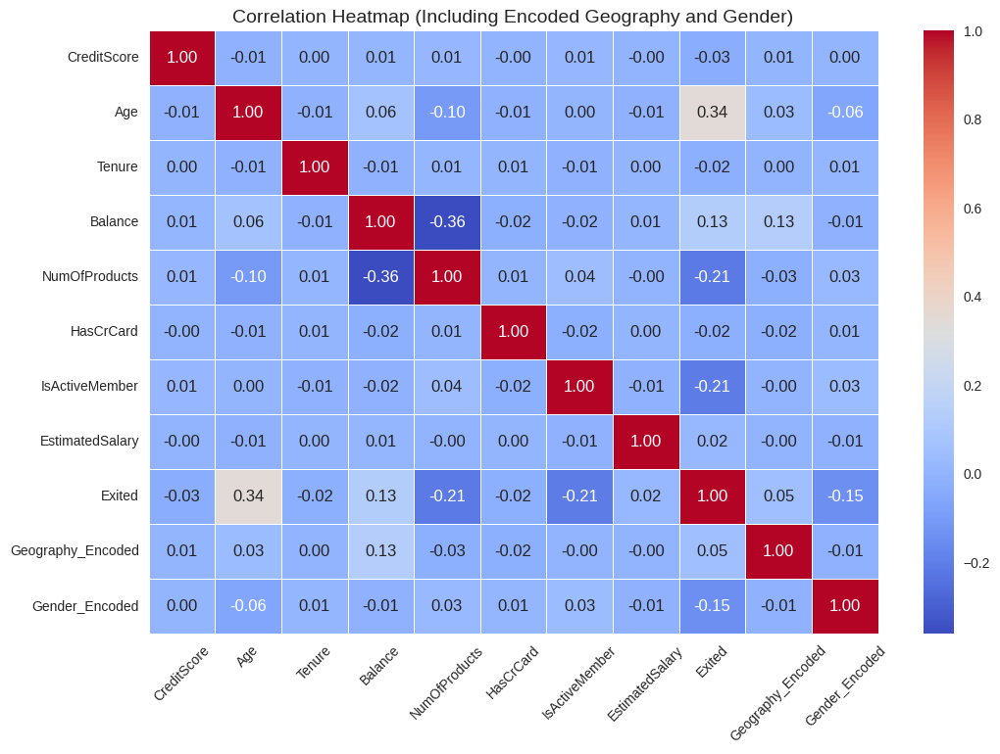

In [11]:
# Compute correlation matrix including encoded Geography and Gender columns
numeric_columns = df.select_dtypes(include=["number"]).columns.tolist()
corr_matrix = df[numeric_columns].corr()

# Plot heatmap using Seaborn
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap (Including Encoded Geography and Gender)", fontsize=14)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()


**Age and Churn:**
The variable with the highest correlation with churn is age (0.34), indicating that older customers may be more likely to leave the bank.

**Balance and Churn:**
The correlation with balance is 0.13, suggesting that customers with higher balances may be more likely to churn. However, this is a low value, suggesting that balance is not a decisive factor in the churn prediction.

**Gender and Churn:**
The correlation with Gender is -0.15, suggesting that women are more likely to churn compared to men. However, since the correlation is relatively low, gender is not a determining factor in predicting churn.

**Number of Products and Churn:**
There is a negative correlation with NumOfProducts (-0.21), implying that customers with more products are less likely to churn.

**Customer Activity and Churn:**
IsActiveMember has a significant negative correlation (-0.21), meaning that active customers tend to stay.

**Other Factors:**
CreditScore, HasCrCard, and Tenure have weak correlations with churn.

In [12]:
# Boxplot to compare Age distribution by Churn status
fig5 = px.box(df, x="Exited_Label", y="Age", color="Exited_Label",
                 title="Age Distribution by Churn Status",
                 labels={"Exited_Label": "Churn Status", "Age": "Customer Age"},
                 color_discrete_sequence=["#AEC6CF", "#FFB6C1"])
fig5.show()

# Distribution plot for Age by Churn status using histogram with KDE
fig6 = px.histogram(df, x="Age", color="Exited_Label", marginal="violin", opacity=0.7,
                        title="Age Distribution by Churn Status",
                        labels={"Age": "Customer Age", "Exited_Label": "Churn Status"},
                        barmode="overlay", histnorm="density",
                        color_discrete_sequence=["#AEC6CF", "#FFB6C1"])
fig6.show()


**Churned customers tend to be older:**
The median age is higher for churned customers (44 vs. 36). The IQR shift suggests that customers aged 38-50 are at a higher risk of churn.

**Non-churned customers are younger on average:**
Their IQR is more concentrated around the early to mid-30s.
Younger customers (under 30) seem less likely to churn.

**The presence of outliers:**
There are outliers on both sides, but their impact is minimal given the wide range of customer ages.

**Implications for Churn Prevention:**
Older customers (38+) require targeted retention strategies, possibly through personalized benefits or better engagement.Younger customers (18-30) show higher retention, suggesting that products/services are more appealing to them.Understanding the needs of mid-aged customers (40-50) is crucial, as they appear to be the most likely to churn.

In [13]:
# Boxplot to compare NumOfProducts distribution by Churn status
fig7 = px.box(df, x="Exited_Label", y="NumOfProducts", color="Exited_Label",
                          title="Product Holding Distribution by Churn Status",
                          labels={"Exited_Label": "Churn Status", "NumOfProducts": "Number of Products"},
                          color_discrete_sequence=["#AEC6CF", "#FFB6C1"])
fig7.show()

**Customers with fewer products are more likely to churn:**
The median for churned customers is 1 product, with most having only 1 product. The upper fence at 1 suggests that customers with more than 1 product rarely churn. Higher engagement with multiple products leads to lower churn.

For non-churned customers, the median is 2 products, and they often have 2 or 3 products.
The presence of customers with 4 products, all in the non-churn category, suggests that customers with a diverse product portfolio are more loyal.
A strong concentration at 1 product for churned customers suggests a risk factor.

If a customer only has 1 product, they are highly likely to leave.
This could indicate that offering additional products early in the customer journey might improve retention.

# Modelling

In [ ]:
# Removing not numerical columns from df
df_model = df.drop(columns=['Geography', 'Gender', 'HasCrCard_Label', 'IsActiveMember_Label', 'Exited_Label'])

In [15]:
df_model.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 165034 entries, 0 to 165033
Data columns (total 11 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   CreditScore        165034 non-null  int64  
 1   Age                165034 non-null  int64  
 2   Tenure             165034 non-null  int64  
 3   Balance            165034 non-null  float64
 4   NumOfProducts      165034 non-null  int64  
 5   HasCrCard          165034 non-null  int64  
 6   IsActiveMember     165034 non-null  int64  
 7   EstimatedSalary    165034 non-null  float64
 8   Exited             165034 non-null  int64  
 9   Geography_Encoded  165034 non-null  int64  
 10  Gender_Encoded     165034 non-null  int64  
dtypes: float64(2), int64(9)
memory usage: 13.9 MB


In [4]:
#df_model = pd.read_csv('df_model.csv')

In [53]:
df_model.describe()

,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Geography_Encoded,Gender_Encoded
count,165034.000000,165034.000000,165034.000000,165034.000000,165034.000000,165034.000000,165034.000000,165034.000000,165034.000000,165034.000000,165034.000000
mean,656.454373,38.125883,5.020353,55478.086689,1.554455,0.753954,0.497770,112574.822734,0.211599,0.648545,0.564429
std,80.103340,8.867207,2.806159,62817.663278,0.547154,0.430707,0.499997,50292.865585,0.408443,0.816574,0.495833
min,350.000000,18.000000,0.000000,0.000000,1.000000,0.000000,0.000000,11.580000,0.000000,0.000000,0.000000
25%,597.000000,32.000000,3.000000,0.000000,1.000000,1.000000,0.000000,74637.570000,0.000000,0.000000,0.000000
50%,659.000000,37.000000,5.000000,0.000000,2.000000,1.000000,0.000000,117948.000000,0.000000,0.000000,1.000000
75%,710.000000,42.000000,7.000000,119939.517500,2.000000,1.000000,1.000000,155152.467500,0.000000,1.000000,1.000000
max,850.000000,92.000000,10.000000,250898.090000,4.000000,1.000000,1.000000,199992.480000,1.000000,2.000000,1.000000


In [21]:
df_model['Exited'].value_counts(normalize=True)

,proportion
Exited,
0,0.788401
1,0.211599


### Random Forest with balanced class weight to handle the bias in the dataset (only 21% of the data is related to churn, the other part belongs to not churn)

Accuracy: 0.8585

Classification Report:

              precision    recall  f1-score   support

           0       0.88      0.95      0.91     26052
           1       0.73      0.53      0.61      6955

    accuracy                           0.86     33007
   macro avg       0.80      0.74      0.76     33007
weighted avg       0.85      0.86      0.85     33007



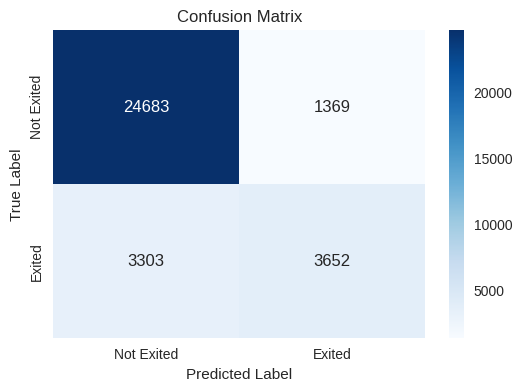

In [9]:
# Prepare the data
X = df_model.drop(columns=['Exited'])  # Independent variables
y = df_model['Exited']  # Target variable

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train the Random Forest Classifier
rf = RandomForestClassifier(n_estimators=200, class_weight="balanced", random_state=42)
rf.fit(X_train, y_train)

# Make predictions
y_pred = rf.predict(X_test)

# Print accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.4f}')

# Print classification report
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))

# Print confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Visualize the confusion matrix
plt.figure(figsize=(6,4))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Exited", "Exited"], yticklabels=["Not Exited", "Exited"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()


In this case, as we are focusing on the classification of the true positive (people that actually exited from the bank), the main metric will be 'Recall'.

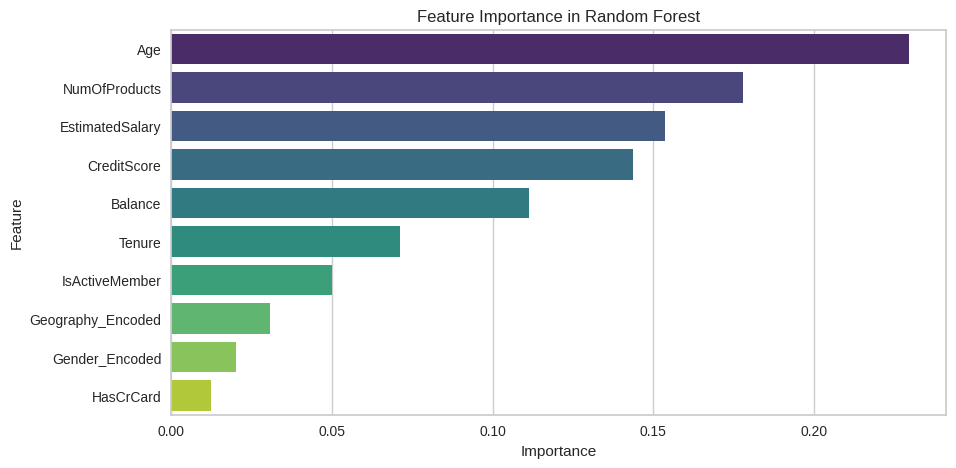

In [11]:
# Feature importances
importances = rf.feature_importances_
feature_names = X.columns

# Feature importance dataset
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10,5))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df, palette='viridis')
plt.title('Feature Importance in Random Forest')
plt.show()

Using pycaret with an internal SMOTE method to balance the dataset. The purpose of it is to get the model that best replicates the data patterns.

In [13]:
# Pycaret setup
from pycaret.classification import setup, compare_models
from imblearn.over_sampling import SMOTE

clf = setup(
    data=df_model,
    target='Exited',
    session_id=42,
    fix_imbalance=True,  # Automated class balance
    fix_imbalance_method=SMOTE(),  # SMOTE for balancing purposes
)



,Description,Value
0,Session id,42
1,Target,Exited
2,Target type,Binary
3,Original data shape,"(165034, 11)"
4,Transformed data shape,"(231667, 11)"
5,Transformed train set shape,"(182156, 11)"
6,Transformed test set shape,"(49511, 11)"
7,Numeric features,10
8,Preprocess,True
9,Imputation type,simple


In [14]:
# Comparing best models
best_model = compare_models(sort='Recall')

# Print best model
print(best_model)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.7413,0.8078,0.7338,0.4341,0.5455,0.3809,0.4065,10.0770
ridge,Ridge Classifier,0.7439,0.8093,0.7325,0.4373,0.5476,0.3845,0.4094,0.4730
lda,Linear Discriminant Analysis,0.7439,0.8093,0.7320,0.4372,0.5474,0.3843,0.4091,0.4540
qda,Quadratic Discriminant Analysis,0.7794,0.8428,0.7319,0.4858,0.5840,0.4421,0.4593,0.6740
nb,Naive Bayes,0.7201,0.7636,0.6950,0.4058,0.5124,0.3346,0.3584,0.4060
ada,Ada Boost Classifier,0.8538,0.8765,0.6134,0.6687,0.6397,0.5482,0.5491,6.1080
gbc,Gradient Boosting Classifier,0.8626,0.8869,0.5917,0.7107,0.6458,0.5614,0.5651,26.6970
lightgbm,Light Gradient Boosting Machine,0.8650,0.8889,0.5740,0.7303,0.6428,0.5610,0.5672,4.3350
xgboost,Extreme Gradient Boosting,0.8640,0.8861,0.5700,0.7285,0.6395,0.5573,0.5637,2.6060
rf,Random Forest Classifier,0.8578,0.8741,0.5568,0.7089,0.6236,0.5376,0.5436,23.0200


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=42, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7402,0.8095,0.7366,0.4331,0.5455,0.3804,0.4066
1,0.7473,0.8166,0.7407,0.4421,0.5537,0.3928,0.4182
2,0.7357,0.7957,0.7162,0.4259,0.5342,0.3659,0.3899
3,0.7349,0.7955,0.7246,0.4257,0.5363,0.3678,0.3934
4,0.7453,0.8106,0.7422,0.4397,0.5522,0.3902,0.4163
5,0.7424,0.8104,0.7361,0.4356,0.5473,0.3834,0.4092
6,0.7391,0.8081,0.7328,0.4314,0.5431,0.3772,0.4031
7,0.7432,0.8126,0.7394,0.4368,0.5492,0.3858,0.4119
8,0.7435,0.8103,0.7354,0.4370,0.5483,0.3850,0.4104


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


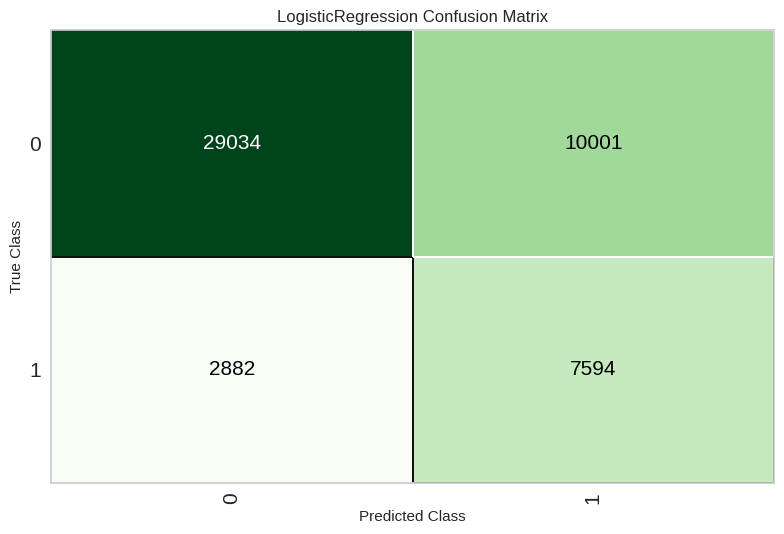

      Recall      F1  Accuracy
Fold                          
0     0.7366  0.5455    0.7402
1     0.7407  0.5537    0.7473
2     0.7162  0.5342    0.7357
3     0.7246  0.5363    0.7349
4     0.7422  0.5522    0.7453
5     0.7361  0.5473    0.7424
6     0.7328  0.5431    0.7391
7     0.7394  0.5492    0.7432
8     0.7354  0.5483    0.7435
9     0.7346  0.5428    0.7381
Mean  0.7339  0.5453    0.7410
Std   0.0075  0.0060    0.0039


In [15]:
# Tunning best model (logistic regression)
tuned_model = tune_model(best_model, optimize='Recall')

# Confussion matrix
plot_model(tuned_model, plot='confusion_matrix')

# Metrics
metrics_df = pull()
print(metrics_df[['Recall', 'F1', 'Accuracy']])

As model is not predicting in the best way the churn class, I will segment by age and balance manually the classes:

In [23]:
# Reading again original df_model
df = pd.read_csv('df_model.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 165034 entries, 0 to 165033
Data columns (total 11 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   CreditScore        165034 non-null  int64  
 1   Age                165034 non-null  int64  
 2   Tenure             165034 non-null  int64  
 3   Balance            165034 non-null  float64
 4   NumOfProducts      165034 non-null  int64  
 5   HasCrCard          165034 non-null  int64  
 6   IsActiveMember     165034 non-null  int64  
 7   EstimatedSalary    165034 non-null  float64
 8   Exited             165034 non-null  int64  
 9   Geography_Encoded  165034 non-null  int64  
 10  Gender_Encoded     165034 non-null  int64  
dtypes: float64(2), int64(9)
memory usage: 13.9 MB


In [24]:
# Function to classify ages into segments
def segment_age(age):
    if age <= 30:
        return "Young"
    elif age <= 50:
        return "Adult"
    else:
        return "OlderAdult"

# Add the 'Age_Segment' column
df["Age_Segment"] = df["Age"].apply(segment_age)

In [25]:
# Class distribution
class_distribution = df.groupby("Age_Segment")["Exited"].value_counts()

# Print the results
print(class_distribution)

Age_Segment  Exited
Adult        0         96527
             1         24511
OlderAdult   1          8024
             0          7103
Young        0         26483
             1          2386
Name: count, dtype: int64


In [26]:
# Balancing each one of the segments
from imblearn.over_sampling import SMOTE
import pandas as pd

# Initialize variables to store resampled DataFrames
df_young, df_adult, df_olderadult = None, None, None

# Apply SMOTE to each segment separately
for segment in df["Age_Segment"].unique():
    print(f"Applying SMOTE to segment: {segment}")

    # Filter the current segment
    df_segment = df[df["Age_Segment"] == segment]

    # Separate features (X) and target variable (y)
    X = df_segment.drop(columns=["Exited", "Age_Segment"])  # Exclude the target variable and segment column
    y = df_segment["Exited"]

    # Apply SMOTE only if there are at least two classes in the target variable
    if y.nunique() > 1:
        smote = SMOTE(sampling_strategy='auto', random_state=42)
        X_resampled, y_resampled = smote.fit_resample(X, y)

        # Convert resampled data to a DataFrame
        df_resampled = pd.DataFrame(X_resampled, columns=X.columns)
        df_resampled["Exited"] = y_resampled  # Add the target variable back
        df_resampled["Age_Segment"] = segment  # Restore the segment column

        # Store the resampled DataFrame in the corresponding variable
        if segment == "Young":
            df_young = df_resampled
        elif segment == "Adult":
            df_adult = df_resampled
        elif segment == "OlderAdult":
            df_olderadult = df_resampled

    else:
        print(f"Skipping SMOTE for {segment}, only one class present.")

# Print class distributions for each segment
if df_young is not None:
    print("Young segment distribution:\n", df_young["Exited"].value_counts())
if df_adult is not None:
    print("Adult segment distribution:\n", df_adult["Exited"].value_counts())
if df_olderadult is not None:
    print("OlderAdult segment distribution:\n", df_olderadult["Exited"].value_counts())


Applying SMOTE to segment: Adult
Applying SMOTE to segment: Young
Applying SMOTE to segment: OlderAdult
Young segment distribution:
 Exited
0    26483
1    26483
Name: count, dtype: int64
Adult segment distribution:
 Exited
0    96527
1    96527
Name: count, dtype: int64
OlderAdult segment distribution:
 Exited
0    8024
1    8024
Name: count, dtype: int64


In [27]:
df_adult

,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Geography_Encoded,Gender_Encoded,Exited,Age_Segment
0,668,33,3,0.000000,2,1,0,181449.970000,0,1,0,Adult
1,627,33,1,0.000000,2,1,1,49503.500000,0,1,0,Adult
2,678,40,10,0.000000,2,1,0,184866.690000,0,1,0,Adult
3,581,34,2,148882.540000,1,1,1,84560.880000,0,1,0,Adult
4,716,33,5,0.000000,2,1,1,15068.830000,2,1,0,Adult
...,...,...,...,...,...,...,...,...,...,...,...,...
193049,641,49,6,127612.379215,1,1,0,82648.822142,1,0,1,Adult
193050,781,39,9,76318.069706,1,0,0,99025.438028,0,1,1,Adult
193051,689,39,3,152355.052571,1,1,0,27034.668994,1,0,1,Adult
193052,698,36,2,0.000000,1,0,0,170825.275363,0,0,1,Adult


In [51]:
# Dropping Age Segment column
df_young = df_young.drop(columns=['Age_Segment'])
df_adult = df_adult.drop(columns=['Age_Segment'])
df_olderadult = df_olderadult.drop(columns=['Age_Segment'])

## Adult model:

In [52]:
# Train and tune model only for the "Adult" segment
# Setup PyCaret environment
s = setup(df_adult, target="Exited", session_id=42)

# Compare models and select the best one based on recall
best_model = compare_models(sort="Recall")

,Description,Value
0,Session id,42
1,Target,Exited
2,Target type,Binary
3,Original data shape,"(193054, 11)"
4,Transformed data shape,"(193054, 11)"
5,Transformed train set shape,"(135137, 11)"
6,Transformed test set shape,"(57917, 11)"
7,Numeric features,10
8,Preprocess,True
9,Imputation type,simple


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.8589,0.9305,0.8619,0.8568,0.8593,0.7178,0.7178,23.7330
xgboost,Extreme Gradient Boosting,0.8567,0.9315,0.8600,0.8544,0.8572,0.7134,0.7134,1.7260
et,Extra Trees Classifier,0.8535,0.9281,0.8598,0.8491,0.8544,0.7070,0.7071,15.0860
ada,Ada Boost Classifier,0.8439,0.9201,0.8552,0.8363,0.8456,0.6878,0.6880,4.2440
lightgbm,Light Gradient Boosting Machine,0.8536,0.9295,0.8549,0.8527,0.8538,0.7072,0.7072,4.9950
gbc,Gradient Boosting Classifier,0.8493,0.9256,0.8540,0.8461,0.8500,0.6986,0.6987,18.5580
ridge,Ridge Classifier,0.8129,0.8887,0.8342,0.8002,0.8168,0.6259,0.6264,0.2510
lda,Linear Discriminant Analysis,0.8129,0.8887,0.8342,0.8002,0.8168,0.6259,0.6264,0.2180
lr,Logistic Regression,0.8138,0.8879,0.8250,0.8069,0.8159,0.6276,0.6277,9.1590
qda,Quadratic Discriminant Analysis,0.8224,0.8998,0.8186,0.8249,0.8217,0.6448,0.6449,0.7140


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

In [53]:
predictions = predict_model(best_model, data=df_adult)
print(predictions.columns)  # Check column names

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Random Forest Classifier,0.9589,0.9870,0.9597,0.9582,0.9589,0.9178,0.9178


Index(['CreditScore', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard',
       'IsActiveMember', 'EstimatedSalary', 'Geography_Encoded',
       'Gender_Encoded', 'Exited', 'prediction_label', 'prediction_score'],
      dtype='object')


In [54]:
# Extract the actual labels and predicted labels
y_true = df_adult["Exited"]  # Actual labels
y_pred = predictions["prediction_label"]  # PyCaret stores predictions in the 'Label' column

# Compute the confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)

# Display the confusion matrix
print("Confusion Matrix:")
print(conf_matrix)

# Display detailed classification metrics (including Recall)
print("\nClassification Report:")
print(classification_report(y_true, y_pred))


Confusion Matrix:
[[92485  4042]
 [ 3890 92637]]

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.96      0.96     96527
           1       0.96      0.96      0.96     96527

    accuracy                           0.96    193054
   macro avg       0.96      0.96      0.96    193054
weighted avg       0.96      0.96      0.96    193054



In [55]:
# Save actual model
from pycaret.classification import save_model
save_model(best_model, "best_model_adult")

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=Memory(location=None),
          steps=[('numerical_imputer',
                  TransformerWrapper(exclude=None,
                                     include=['CreditScore', 'Age', 'Tenure',
                                              'Balance', 'NumOfProducts',
                                              'HasCrCard', 'IsActiveMember',
                                              'EstimatedSalary',
                                              'Geography_Encoded',
                                              'Gender_Encoded'],
                                     transformer=SimpleImputer(add_indicator=False,
                                                               copy=True,
                                                               fill_value=None,
                                                               keep_empty_features=False,
                                                               missi...
                  RandomForestClassifier(boo

## Young model:

In [61]:
# Train and tune model only for the "young" segment
# Setup PyCaret environment
s = setup(df_young, target="Exited", session_id=42)

# Compare models and select the best one based on recall
best_model = compare_models(sort="Recall")

,Description,Value
0,Session id,42
1,Target,Exited
2,Target type,Binary
3,Original data shape,"(52966, 11)"
4,Transformed data shape,"(52966, 11)"
5,Transformed train set shape,"(37076, 11)"
6,Transformed test set shape,"(15890, 11)"
7,Numeric features,10
8,Preprocess,True
9,Imputation type,simple


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.8968,0.9583,0.9147,0.8832,0.8986,0.7936,0.7942,5.1910
et,Extra Trees Classifier,0.8949,0.9589,0.9137,0.8806,0.8968,0.7897,0.7903,3.2780
xgboost,Extreme Gradient Boosting,0.8870,0.9513,0.9015,0.8761,0.8886,0.7739,0.7743,0.4660
dt,Decision Tree Classifier,0.8565,0.8566,0.8802,0.8404,0.8598,0.7130,0.7138,0.2900
lightgbm,Light Gradient Boosting Machine,0.8654,0.9385,0.8748,0.8588,0.8667,0.7308,0.7310,1.3980
gbc,Gradient Boosting Classifier,0.8455,0.9244,0.8613,0.8350,0.8479,0.6910,0.6914,4.2490
ada,Ada Boost Classifier,0.8375,0.9172,0.8519,0.8280,0.8398,0.6749,0.6752,1.2170
ridge,Ridge Classifier,0.8040,0.8810,0.8273,0.7906,0.8085,0.6080,0.6088,0.0610
lda,Linear Discriminant Analysis,0.8041,0.8810,0.8273,0.7906,0.8085,0.6081,0.6088,0.0690
knn,K Neighbors Classifier,0.7498,0.8206,0.8202,0.7191,0.7662,0.4996,0.5047,0.3530


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

In [19]:
predictions = predict_model(best_model, data=df_young)
print(predictions.columns)  # Check column names


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Random Forest Classifier,0.9693,0.9917,0.9758,0.9633,0.9695,0.9386,0.9387


Index(['CreditScore', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard',
       'IsActiveMember', 'EstimatedSalary', 'Geography_Encoded',
       'Gender_Encoded', 'Age_Segment', 'Exited', 'prediction_label',
       'prediction_score'],
      dtype='object')


In [20]:
# Make predictions on the dataset
predictions = predict_model(best_model, data=df_young)

# Extract the actual labels and predicted labels
y_true = df_young["Exited"]  # Actual labels
y_pred = predictions["prediction_label"]  # PyCaret stores predictions in the 'Label' column

# Compute the confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)

# Display the confusion matrix
print("Confusion Matrix:")
print(conf_matrix)

# Display detailed classification metrics (including Recall)
print("\nClassification Report:")
print(classification_report(y_true, y_pred))


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Random Forest Classifier,0.9693,0.9917,0.9758,0.9633,0.9695,0.9386,0.9387


Confusion Matrix:
[[25498   985]
 [  640 25843]]

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.96      0.97     26483
           1       0.96      0.98      0.97     26483

    accuracy                           0.97     52966
   macro avg       0.97      0.97      0.97     52966
weighted avg       0.97      0.97      0.97     52966



In [62]:
# Save the best model
save_model(best_model, "best_model_young")
print("Best model saved successfully!")

Transformation Pipeline and Model Successfully Saved
Best model saved successfully!


## OlderAdult Model:

In [58]:
# Train and tune model only for the "olderadult" segment
# Setup PyCaret environment
s = setup(df_olderadult, target="Exited", session_id=42)

# Compare models and select the best one based on recall
best_model = compare_models(sort="Recall")

,Description,Value
0,Session id,42
1,Target,Exited
2,Target type,Binary
3,Original data shape,"(16048, 11)"
4,Transformed data shape,"(16048, 11)"
5,Transformed train set shape,"(11233, 11)"
6,Transformed test set shape,"(4815, 11)"
7,Numeric features,10
8,Preprocess,True
9,Imputation type,simple


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.7903,0.8747,0.8067,0.7814,0.7937,0.5807,0.5813,0.7600
nb,Naive Bayes,0.6416,0.7001,0.8027,0.6071,0.6913,0.2832,0.2993,0.0720
gbc,Gradient Boosting Classifier,0.7905,0.8746,0.7969,0.7871,0.7918,0.5810,0.5813,1.5530
rf,Random Forest Classifier,0.7879,0.8687,0.7896,0.7873,0.7882,0.5759,0.5762,2.4920
xgboost,Extreme Gradient Boosting,0.7831,0.8638,0.7881,0.7805,0.7842,0.5663,0.5665,0.2150
et,Extra Trees Classifier,0.7827,0.8624,0.7858,0.7813,0.7833,0.5654,0.5657,1.6100
ada,Ada Boost Classifier,0.7848,0.8655,0.7725,0.7923,0.7821,0.5697,0.5700,0.5960
qda,Quadratic Discriminant Analysis,0.7553,0.8394,0.7267,0.7709,0.7481,0.5106,0.5115,0.0610
dt,Decision Tree Classifier,0.7211,0.7211,0.7121,0.7252,0.7185,0.4422,0.4424,0.1240
ridge,Ridge Classifier,0.7459,0.8125,0.6781,0.7850,0.7274,0.4919,0.4967,0.0590


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

In [27]:
predictions = predict_model(best_model, data=df_olderadult)
print(predictions.columns)  # Check column names

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Light Gradient Boosting Machine,0.8316,0.9131,0.8402,0.8260,0.8331,0.6633,0.6634


Index(['CreditScore', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard',
       'IsActiveMember', 'EstimatedSalary', 'Geography_Encoded',
       'Gender_Encoded', 'Age_Segment', 'Exited', 'prediction_label',
       'prediction_score'],
      dtype='object')


In [28]:
# Make predictions on the dataset
predictions = predict_model(best_model, data=df_olderadult)

# Extract the actual labels and predicted labels
y_true = df_olderadult["Exited"]  # Actual labels
y_pred = predictions["prediction_label"]  # PyCaret stores predictions in the 'Label' column

# Compute the confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)

# Display the confusion matrix
print("Confusion Matrix:")
print(conf_matrix)

# Display detailed classification metrics (including Recall)
print("\nClassification Report:")
print(classification_report(y_true, y_pred))


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Light Gradient Boosting Machine,0.8316,0.9131,0.8402,0.8260,0.8331,0.6633,0.6634


Confusion Matrix:
[[6604 1420]
 [1282 6742]]

Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.82      0.83      8024
           1       0.83      0.84      0.83      8024

    accuracy                           0.83     16048
   macro avg       0.83      0.83      0.83     16048
weighted avg       0.83      0.83      0.83     16048



In [29]:
from lightgbm import LGBMClassifier
from sklearn.model_selection import train_test_split
from skopt import BayesSearchCV

# Split data
X_train, X_test, y_train, y_test = train_test_split(
    df_olderadult.drop(columns=["Exited", "Age_Segment"]),
    df_olderadult["Exited"],
    test_size=0.2,
    random_state=42
)

# Define LightGBM model
lgb_model = LGBMClassifier(random_state=42)

# Define hyperparameter search space
param_grid = {
    'n_estimators': (50, 500),  # Number of trees
    'max_depth': (3, 20),  # Depth of each tree
    'min_child_samples': (5, 50),  # Minimum data needed in a child
    'learning_rate': (0.01, 0.3, 'log-uniform'),  # Learning rate
    'subsample': (0.5, 1.0),  # Fraction of data to use
    'colsample_bytree': (0.5, 1.0)  # Feature fraction
}

# Perform Bayesian Optimization
bayes_search = BayesSearchCV(
    lgb_model,
    param_grid,
    n_iter=30,
    cv=3,
    scoring='recall',
    n_jobs=-1,
    random_state=42
)

bayes_search.fit(X_train, y_train)

# Get best model
best_lgb = bayes_search.best_estimator_
print(f"Best LightGBM model for older adult: {best_lgb}")
print(f"Best parameters for older adult: {bayes_search.best_params_}")

[LightGBM] [Info] Number of positive: 6423, number of negative: 6415
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 824
[LightGBM] [Info] Number of data points in the train set: 12838, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500312 -> initscore=0.001246
[LightGBM] [Info] Start training from score 0.001246
Best LightGBM model for older adult: LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.039971388880462214,
               max_depth=14, min_child_samples=9, min_child_weight=0.001,
               min_split_gain=0.0, n_estimators=161, n_jobs=None, num_leaves=31,
               objective=None, random_state=42, reg_alpha=0.0, reg_lambda=0.0,
               subsamp

Confusion Matrix:
 [[1286  323]
 [ 345 1256]]


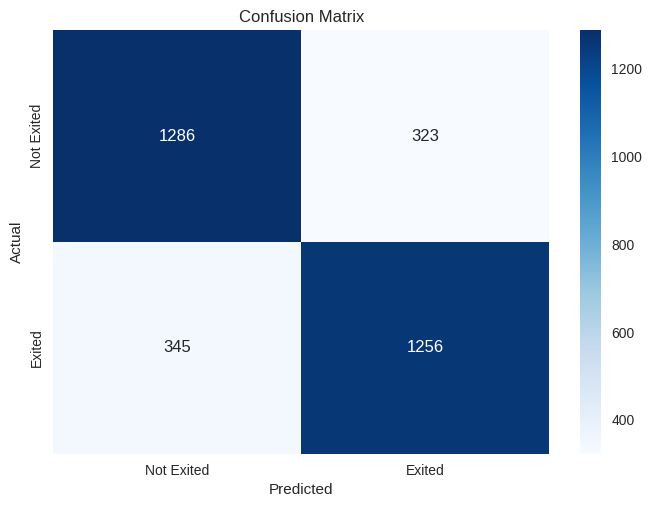

Classification Report:
               precision    recall  f1-score   support

           0       0.79      0.80      0.79      1609
           1       0.80      0.78      0.79      1601

    accuracy                           0.79      3210
   macro avg       0.79      0.79      0.79      3210
weighted avg       0.79      0.79      0.79      3210



In [30]:
# Make predictions
y_pred = best_lgb.predict(X_test)

# Compute confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", conf_matrix)

# Plot confusion matrix
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=["Not Exited", "Exited"], yticklabels=["Not Exited", "Exited"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Compute and print classification report
class_report = classification_report(y_test, y_pred)
print("Classification Report:\n", class_report)

In [60]:
# Save the best model (first one by pycaret)
save_model(best_model, "best_model_olderadult")


Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=Memory(location=None),
          steps=[('numerical_imputer',
                  TransformerWrapper(exclude=None,
                                     include=['CreditScore', 'Age', 'Tenure',
                                              'Balance', 'NumOfProducts',
                                              'HasCrCard', 'IsActiveMember',
                                              'EstimatedSalary',
                                              'Geography_Encoded',
                                              'Gender_Encoded'],
                                     transformer=SimpleImputer(add_indicator=False,
                                                               copy=True,
                                                               fill_value=None,
                                                               keep_empty_features=False,
                                                               missi...
                  LGBMClassifier(boosting_ty

# Pipeline

In [70]:
def categorize_age(age):
    """Categorize age into segments."""
    if age <= 30:
        return "young"
    elif age <= 50:
        return "adult"
    else:
        return "olderadult"

def preprocess_data(df):
    """Preprocess the DataFrame: remove unnecessary columns, encode categorical variables, and convert data types."""
    df = df.copy()

    print("\n Before preprocessing:", df.columns)

    if "Age" not in df.columns:
        raise KeyError("Column 'Age' is missing before preprocessing.")

    df = df.drop(columns=["id", "CustomerId", "Surname"])  # Drop unnecessary columns

    # Encode categorical variables
    label_encoder = LabelEncoder()
    df["Geography_Encoded"] = label_encoder.fit_transform(df["Geography"])
    df["Gender_Encoded"] = label_encoder.fit_transform(df["Gender"])

    # Drop original categorical columns
    df = df.drop(columns=["Geography", "Gender"])

    # Convert all columns to int except Balance, EstimatedSalary, and Age
    cols_to_int = [col for col in df.columns if col not in ["Balance", "EstimatedSalary", "Age"]]
    df[cols_to_int] = df[cols_to_int].astype(int)

    # Add Age_Segment column
    df["Age_Segment"] = df["Age"].apply(categorize_age)

    print("\nAfter preprocessing:", df.columns)
    return df

def predict_by_age_segment(df):
    """Load the corresponding model based on Age_Segment and generate predictions."""
    df = preprocess_data(df)  # Preprocess data

    if df.empty:
        print(" No data available for prediction.")
        return df

    print("\n🛠️ Before model prediction:", df.columns)

    # Select only the required features for the model
    feature_cols = [
        "CreditScore", "Age", "Tenure", "Balance", "NumOfProducts",
        "HasCrCard", "IsActiveMember", "EstimatedSalary",
        "Geography_Encoded", "Gender_Encoded"
    ]

    if not all(col in df.columns for col in feature_cols):
        missing_cols = [col for col in feature_cols if col not in df.columns]
        raise KeyError(f" Missing columns in input data: {missing_cols}")

    # Split data by Age_Segment
    results = []
    for segment in ["young", "adult", "olderadult"]:
        df_segment = df[df["Age_Segment"] == segment].copy()
        if df_segment.empty:
            print(f" No records found for segment: {segment}")
            continue

        model_filename = f"best_model_{segment}"
        print(f" Loading model: {model_filename}")
        model = load_model(model_filename)

        X = df_segment[feature_cols]
        df_segment["Prediction"] = model.predict(X)
        results.append(df_segment)

    # Concatenate results
    if results:
        df_results = pd.concat(results)
        print("\n Prediction complete! Returning results.")
        return df_results
    else:
        print(" No valid predictions were made.")
        return pd.DataFrame()




In [71]:
# Testing pipeline:
df_test = pd.read_csv("test.csv")

In [72]:
# Using pipeline:
df_test = pd.read_csv("test.csv")
df_results = predict_by_age_segment(df_test)
print(df_results[["Age", "Age_Segment", "Prediction"]])


📌 Before preprocessing: Index(['id', 'CustomerId', 'Surname', 'CreditScore', 'Geography', 'Gender',
       'Age', 'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard',
       'IsActiveMember', 'EstimatedSalary'],
      dtype='object')

✅ After preprocessing: Index(['CreditScore', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard',
       'IsActiveMember', 'EstimatedSalary', 'Geography_Encoded',
       'Gender_Encoded', 'Age_Segment'],
      dtype='object')

🛠️ Before model prediction: Index(['CreditScore', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard',
       'IsActiveMember', 'EstimatedSalary', 'Geography_Encoded',
       'Gender_Encoded', 'Age_Segment'],
      dtype='object')
🚀 Loading model: best_model_young
Transformation Pipeline and Model Successfully Loaded
🚀 Loading model: best_model_adult
Transformation Pipeline and Model Successfully Loaded
🚀 Loading model: best_model_olderadult
Transformation Pipeline and Model Successfully Loaded

✅ Prediction complete! Retur

In [74]:
# Storing df_results
df_results.to_csv("df_predictions.csv", index=False)

**Conclusions and Future Enhancements:**
* Age plays a crucial role in this classification problem, as it has the highest importance and correlation value. However, since most users fall within the adult range, further segmentation is needed. Additionally, the number of products is another key factor to consider.

* To reduce churn, one suggested action is to offer more attractive products to customers who are more likely to leave, as this variable shows a significant correlation with churn.

* It is essential to take country-specific actions, considering that Germany has the highest churn rate. Conducting market research and providing tailored solutions for this country would be the best approach.

* Analyzing consumption habits by gender is necessary, allowing the bank to offer personalized solutions that better fit each customer’s needs.